# Libraries

In [103]:
import scipy.io as sio
import sys

import pandas as pd
import numpy as np

import statsmodels.tsa.stattools as tsa
from statsmodels.tsa.api import VAR
import statistics

sys.path.insert(0, '../../Libraries')
import JacksonsTSPackage as jts

In [104]:
sst = sio.loadmat('data/sst.mat')
sst

{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sat Dec 14 14:14:49 2013',
 '__version__': '1.0',
 '__globals__': [],
 'X': array([[array([[28.15, 28.27, 28.05, 28.39, 28.67, 29.26],
        [28.43, 28.81, 27.88, 28.09, 27.12, 26.99],
        [28.12, 27.69, 28.03, 26.9 , 25.84, 24.95],
        [28.56, 28.36, 28.44, 28.35, 27.3 , 25.71],
        [29.29, 29.73, 29.18, 28.41, 27.63, 27.01]])],
        [array([[28.16, 28.27, 28.06, 28.53, 28.68, 29.44],
        [28.43, 28.81, 27.89, 28.09, 27.19, 27.12],
        [28.11, 27.7 , 28.  , 26.93, 26.02, 25.07],
        [28.56, 28.34, 28.45, 28.47, 27.41, 25.83],
        [29.31, 29.76, 29.18, 28.55, 27.63, 27.01]])],
        [array([[28.19, 28.3 , 28.09, 28.65, 28.68, 29.66],
        [28.44, 28.81, 27.93, 28.09, 27.42, 27.33],
        [28.13, 27.74, 28.05, 27.03, 26.17, 25.14],
        [28.57, 28.33, 28.52, 28.6 , 27.55, 25.98],
        [29.34, 29.83, 29.22, 28.74, 27.63, 27.01]])],
        ...,
        [array([[29.58, 29.12,

In [105]:
N = len(sst['X'])
N_train = 1800
N_test = N - N_train
print(f"N: {N}")
print(f"N_train: {N_train}")
print(f"N_test: {N_test}")

N: 2000
N_train: 1800
N_test: 200


# Applying the Discrete Cosine Transform

In [106]:
tensor_shape = (len(sst['X']), sst['X'][0][0].shape[0], sst['X'][0][0].shape[1])
tensor_shape

(2000, 5, 6)

In [107]:
tensor_data = np.zeros(tensor_shape)
for i in range(tensor_shape[0]):
    tensor_data[i] = sst['X'][i][0]
tensor_data

array([[[28.15, 28.27, 28.05, 28.39, 28.67, 29.26],
        [28.43, 28.81, 27.88, 28.09, 27.12, 26.99],
        [28.12, 27.69, 28.03, 26.9 , 25.84, 24.95],
        [28.56, 28.36, 28.44, 28.35, 27.3 , 25.71],
        [29.29, 29.73, 29.18, 28.41, 27.63, 27.01]],

       [[28.16, 28.27, 28.06, 28.53, 28.68, 29.44],
        [28.43, 28.81, 27.89, 28.09, 27.19, 27.12],
        [28.11, 27.7 , 28.  , 26.93, 26.02, 25.07],
        [28.56, 28.34, 28.45, 28.47, 27.41, 25.83],
        [29.31, 29.76, 29.18, 28.55, 27.63, 27.01]],

       [[28.19, 28.3 , 28.09, 28.65, 28.68, 29.66],
        [28.44, 28.81, 27.93, 28.09, 27.42, 27.33],
        [28.13, 27.74, 28.05, 27.03, 26.17, 25.14],
        [28.57, 28.33, 28.52, 28.6 , 27.55, 25.98],
        [29.34, 29.83, 29.22, 28.74, 27.63, 27.01]],

       ...,

       [[29.58, 29.12, 29.23, 28.31, 27.29, 27.73],
        [29.33, 28.95, 28.56, 25.8 , 25.68, 23.33],
        [29.65, 28.86, 28.2 , 25.91, 23.54, 22.22],
        [30.19, 29.18, 28.15, 26.98, 25.32, 2

In [108]:
train_tensor = jts.extract_train_tensor(tensor_data, N_train)
train_tensor

array([[[28.15, 28.27, 28.05, 28.39, 28.67, 29.26],
        [28.43, 28.81, 27.88, 28.09, 27.12, 26.99],
        [28.12, 27.69, 28.03, 26.9 , 25.84, 24.95],
        [28.56, 28.36, 28.44, 28.35, 27.3 , 25.71],
        [29.29, 29.73, 29.18, 28.41, 27.63, 27.01]],

       [[28.16, 28.27, 28.06, 28.53, 28.68, 29.44],
        [28.43, 28.81, 27.89, 28.09, 27.19, 27.12],
        [28.11, 27.7 , 28.  , 26.93, 26.02, 25.07],
        [28.56, 28.34, 28.45, 28.47, 27.41, 25.83],
        [29.31, 29.76, 29.18, 28.55, 27.63, 27.01]],

       [[28.19, 28.3 , 28.09, 28.65, 28.68, 29.66],
        [28.44, 28.81, 27.93, 28.09, 27.42, 27.33],
        [28.13, 27.74, 28.05, 27.03, 26.17, 25.14],
        [28.57, 28.33, 28.52, 28.6 , 27.55, 25.98],
        [29.34, 29.83, 29.22, 28.74, 27.63, 27.01]],

       ...,

       [[29.21, 29.03, 28.53, 28.37, 27.62, 27.97],
        [29.48, 28.78, 28.19, 26.28, 25.95, 25.73],
        [29.04, 28.46, 27.52, 25.5 , 23.52, 22.35],
        [29.49, 29.14, 28.04, 27.61, 25.64, 2

In [109]:
test_tensor = jts.extract_test_tensor(tensor_data, N_train, N_test)
test_tensor

array([[[29.32, 29.01, 28.58, 28.38, 27.63, 27.98],
        [29.45, 28.74, 28.19, 26.29, 25.96, 25.69],
        [29.  , 28.42, 27.52, 25.5 , 23.62, 22.75],
        [29.49, 29.14, 28.03, 27.61, 25.62, 24.38],
        [29.85, 29.48, 28.6 , 27.61, 26.28, 24.48]],

       [[29.35, 29.  , 28.6 , 28.39, 27.64, 27.99],
        [29.46, 28.75, 28.21, 26.32, 25.98, 25.68],
        [28.99, 28.41, 27.54, 25.54, 23.7 , 22.9 ],
        [29.48, 29.15, 28.05, 27.62, 25.65, 24.42],
        [29.83, 29.48, 28.62, 27.62, 26.29, 24.51]],

       [[29.29, 28.93, 28.62, 28.4 , 27.66, 28.  ],
        [29.47, 28.76, 28.24, 26.35, 25.97, 25.69],
        [29.01, 28.41, 27.58, 25.58, 23.74, 22.92],
        [29.48, 29.17, 28.08, 27.65, 25.67, 24.46],
        [29.84, 29.48, 28.67, 27.64, 26.32, 24.58]],

       ...,

       [[29.58, 29.12, 29.23, 28.31, 27.29, 27.73],
        [29.33, 28.95, 28.56, 25.8 , 25.68, 23.33],
        [29.65, 28.86, 28.2 , 25.91, 23.54, 22.22],
        [30.19, 29.18, 28.15, 26.98, 25.32, 2

In [110]:
train_dct_tensor = jts.apply_dct_to_tensor(train_tensor)
train_dct_tensor

array([[[ 3.41580000e+02, -2.88603771e+00,  1.68008928e+00,
         -5.23259018e-01, -3.00000000e-02, -6.65722417e-01],
        [ 3.34640000e+02,  5.06318330e+00, -9.52627944e-01,
         -5.65685425e-02, -4.70000000e-01, -2.05031092e+00],
        [ 3.23060000e+02,  9.32519587e+00, -3.22161450e+00,
          2.68700577e-01,  9.40000000e-01,  1.20761002e+00],
        [ 3.33440000e+02,  7.05143101e+00, -4.36476804e+00,
          2.40416306e+00, -2.60000000e-01,  1.50068830e-01],
        [ 3.42500000e+02,  7.77305158e+00, -2.23434554e+00,
         -8.34386002e-01, -8.30000000e-01, -3.02107863e-01]],

       [[ 3.42280000e+02, -3.29588758e+00,  1.74937132e+00,
         -5.65685425e-01,  2.90000000e-01, -9.90719472e-01],
        [ 3.35060000e+02,  4.71822402e+00, -7.44781847e-01,
         -1.55563492e-01, -4.70000000e-01, -1.99929040e+00],
        [ 3.23660000e+02,  8.80258057e+00, -3.03108891e+00,
          4.10121933e-01,  6.70000000e-01,  1.26482228e+00],
        [ 3.34120000e+02,  6.5

In [111]:
matrix_shape = train_dct_tensor[0].shape
train_dct_tensor_model_sets = np.zeros((matrix_shape[1], N_train, matrix_shape[0]))
for i in range(matrix_shape[1]):
    for j in range(N_train):
        train_dct_tensor_model_sets[i][j] = train_dct_tensor[j][:,i]
train_dct_tensor_model_sets

array([[[ 3.41580000e+02,  3.34640000e+02,  3.23060000e+02,
          3.33440000e+02,  3.42500000e+02],
        [ 3.42280000e+02,  3.35060000e+02,  3.23660000e+02,
          3.34120000e+02,  3.42880000e+02],
        [ 3.43140000e+02,  3.36040000e+02,  3.24520000e+02,
          3.35100000e+02,  3.43540000e+02],
        ...,
        [ 3.41460000e+02,  3.28820000e+02,  3.12780000e+02,
          3.28440000e+02,  3.32360000e+02],
        [ 3.41420000e+02,  3.28640000e+02,  3.12880000e+02,
          3.28360000e+02,  3.32400000e+02],
        [ 3.41580000e+02,  3.28660000e+02,  3.13180000e+02,
          3.28460000e+02,  3.32460000e+02]],

       [[-2.88603771e+00,  5.06318330e+00,  9.32519587e+00,
          7.05143101e+00,  7.77305158e+00],
        [-3.29588758e+00,  4.71822402e+00,  8.80258057e+00,
          6.57882086e+00,  7.78164569e+00],
        [-3.66710041e+00,  4.02729009e+00,  8.52454259e+00,
          6.06517131e+00,  7.86095047e+00],
        ...,
        [ 4.47235927e+00,  1.2235356

In [112]:
test_tensor_model_sets = np.zeros((matrix_shape[1], N_test, matrix_shape[0]))
for i in range(matrix_shape[1]):
    for j in range(N_test):
        test_tensor_model_sets[i][j] = test_tensor[j][:,i]
test_tensor_model_sets

array([[[29.32, 29.45, 29.  , 29.49, 29.85],
        [29.35, 29.46, 28.99, 29.48, 29.83],
        [29.29, 29.47, 29.01, 29.48, 29.84],
        ...,
        [29.58, 29.33, 29.65, 30.19, 30.24],
        [29.61, 29.36, 29.78, 30.22, 30.26],
        [29.61, 29.45, 29.68, 30.41, 30.3 ]],

       [[29.01, 28.74, 28.42, 29.14, 29.48],
        [29.  , 28.75, 28.41, 29.15, 29.48],
        [28.93, 28.76, 28.41, 29.17, 29.48],
        ...,
        [29.12, 28.95, 28.86, 29.18, 29.48],
        [29.16, 28.95, 28.94, 29.28, 29.48],
        [29.18, 28.97, 29.  , 29.28, 29.48]],

       [[28.58, 28.19, 27.52, 28.03, 28.6 ],
        [28.6 , 28.21, 27.54, 28.05, 28.62],
        [28.62, 28.24, 27.58, 28.08, 28.67],
        ...,
        [29.23, 28.56, 28.2 , 28.15, 28.95],
        [29.25, 28.58, 28.28, 28.43, 29.26],
        [29.28, 28.61, 28.28, 28.49, 29.42]],

       [[28.38, 26.29, 25.5 , 27.61, 27.61],
        [28.39, 26.32, 25.54, 27.62, 27.62],
        [28.4 , 26.35, 25.58, 27.65, 27.64],
        ..

In [113]:
result_tensor_model_sets = np.zeros((matrix_shape[1], N_test, matrix_shape[0]))
result_tensor_model_sets.shape

(6, 200, 5)

# Building the First VAR Model

In [114]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[0])
train_df

,0,1,2,3,4
0,341.58,334.64,323.06,333.44,342.50
1,342.28,335.06,323.66,334.12,342.88
2,343.14,336.04,324.52,335.10,343.54
3,344.38,336.82,325.54,335.96,344.54
4,345.16,337.96,326.36,336.98,345.06
...,...,...,...,...,...
1795,341.60,328.92,312.88,328.56,332.36
1796,341.52,328.82,312.80,328.48,332.36
1797,341.46,328.82,312.78,328.44,332.36
1798,341.42,328.64,312.88,328.36,332.40


In [115]:
test_df = pd.DataFrame(test_tensor_model_sets[0])
test_df

,0,1,2,3,4
0,29.32,29.45,29.00,29.49,29.85
1,29.35,29.46,28.99,29.48,29.83
2,29.29,29.47,29.01,29.48,29.84
3,29.35,29.50,29.09,29.55,29.88
4,29.47,29.58,29.23,29.66,29.95
...,...,...,...,...,...
195,29.59,29.26,29.42,29.84,30.11
196,29.57,29.31,29.54,29.99,30.16
197,29.58,29.33,29.65,30.19,30.24
198,29.61,29.36,29.78,30.22,30.26


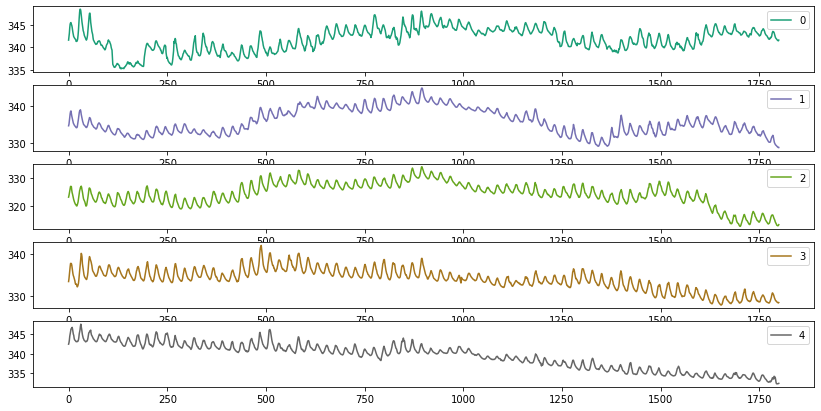

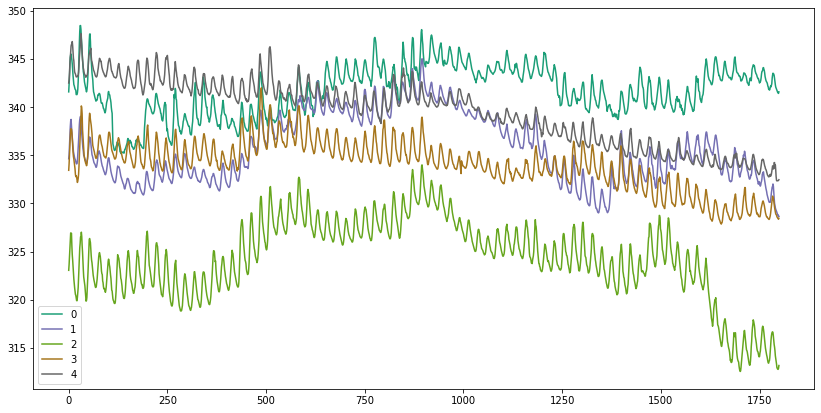

In [116]:
jts.plot_ts(train_df)

In [117]:
jts.mts_adf(train_df)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.772
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0624. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -1.1645
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.6887. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-

### Differencing

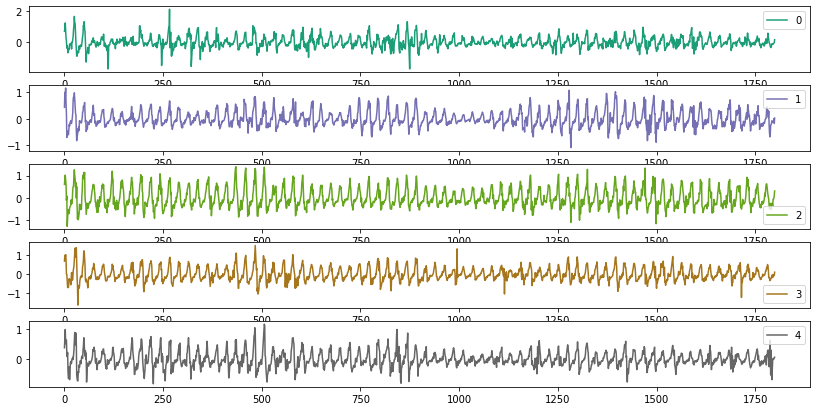

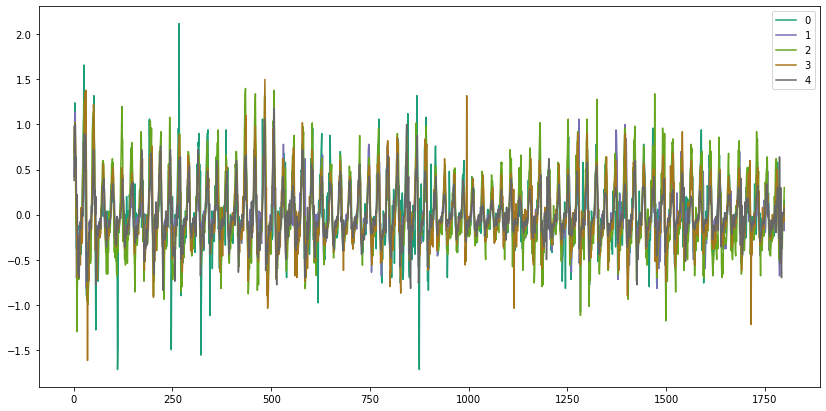

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.6846
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.071
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test St

In [118]:
train_diff = train_df.diff().dropna()
jts.plot_ts(train_diff)
jts.mts_adf(train_diff)

In [119]:
train_diff

,0,1,2,3,4
1,0.70,0.42,0.60,0.68,0.38
2,0.86,0.98,0.86,0.98,0.66
3,1.24,0.78,1.02,0.86,1.00
4,0.78,1.14,0.82,1.02,0.52
5,0.26,0.58,0.58,0.76,0.64
...,...,...,...,...,...
1795,-0.14,-0.12,-0.08,-0.06,0.02
1796,-0.08,-0.10,-0.08,-0.08,0.00
1797,-0.06,0.00,-0.02,-0.04,0.00
1798,-0.04,-0.18,0.10,-0.08,0.04


### Order Selection and Modeling

In [120]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -17.690908     -17.599232     -17.657065      4189.392449   0.000000     
2        -17.926427     -17.758278     -17.864351      443.760989    0.000000     
3        -18.079361     -17.834670     -17.989026      295.925777    0.000000     
4        -18.134494     -17.813191     -18.015872      121.990140    0.000000     
5        -18.143322     -17.745336     -17.996385      39.894954     0.029897     
6        -18.153058     -17.678321     -17.977780      41.338663     0.021144     
7        -18.159923     -17.608363     -17.956275      36.137518     0.069539     
8        -18.175277     -17.546824     -17.943232      50.842033     0.001676     


    AIC  = 8
    BIC  = 3
    HQIC = 4
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [121]:
model = VAR(train_diff)
fit = model.fit(8)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:09
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -17.5468
Nobs:                     1791.00    HQIC:                  -17.9432
Log likelihood:           3774.37    FPE:                1.27819e-08
AIC:                     -18.1753    Det(Omega_mle):     1.14142e-08
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.001466         0.005017            0.292           0.770
L1.0          0.456258         0.024554           18.582           0.000
L1.1          0.217852         0.037493            5.810           0.000
L1.2          0.126742 

### Model Results

In [122]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.151361,0.101112,0.235589,0.128419,0.101522
1,0.139509,0.122295,0.270025,0.188415,0.116217
2,0.186861,0.177965,0.267063,0.213295,0.141163
3,0.153492,0.164275,0.234647,0.197173,0.115931
4,0.117026,0.142380,0.166804,0.156437,0.088708
...,...,...,...,...,...
195,-0.000963,-0.003843,-0.005244,-0.003667,-0.006865
196,-0.000963,-0.003842,-0.005244,-0.003667,-0.006865
197,-0.000963,-0.003842,-0.005244,-0.003667,-0.006865
198,-0.000963,-0.003842,-0.005244,-0.003667,-0.006865


In [123]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[0] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,341.731361,328.761112,313.415589,328.588419,332.561522
1,341.870871,328.883406,313.685615,328.776833,332.677739
2,342.057732,329.061371,313.952677,328.990129,332.818902
3,342.211224,329.225646,314.187324,329.187302,332.934833
4,342.328250,329.368027,314.354128,329.343739,333.023541
...,...,...,...,...,...
195,341.808251,328.368134,312.891355,328.297467,331.458485
196,341.807288,328.364291,312.886111,328.293800,331.451620
197,341.806325,328.360449,312.880866,328.290133,331.444755
198,341.805362,328.356606,312.875622,328.286465,331.437891


# Building the Second VAR Model

In [124]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[1])
train_df

,0,1,2,3,4
0,-2.886038,5.063183,9.325196,7.051431,7.773052
1,-3.295888,4.718224,8.802581,6.578821,7.781646
2,-3.667100,4.027290,8.524543,6.065171,7.860950
3,-3.954476,3.589899,8.392731,5.932716,7.970942
4,-3.839952,3.103890,8.725579,6.231088,8.268298
...,...,...,...,...,...
1795,4.618957,12.155680,21.210862,15.161392,15.753158
1796,4.576531,12.207073,21.119445,15.170358,15.796972
1797,4.472359,12.235357,20.955931,15.198642,15.744193
1798,4.458217,12.268817,20.715144,15.163794,15.705556


In [125]:
test_df = pd.DataFrame(test_tensor_model_sets[1])
test_df

,0,1,2,3,4
0,29.01,28.74,28.42,29.14,29.48
1,29.00,28.75,28.41,29.15,29.48
2,28.93,28.76,28.41,29.17,29.48
3,29.02,28.80,28.45,29.20,29.48
4,29.21,28.89,28.52,29.24,29.48
...,...,...,...,...,...
195,29.06,28.81,28.74,29.02,29.48
196,29.08,28.86,28.78,29.11,29.48
197,29.12,28.95,28.86,29.18,29.48
198,29.16,28.95,28.94,29.28,29.48


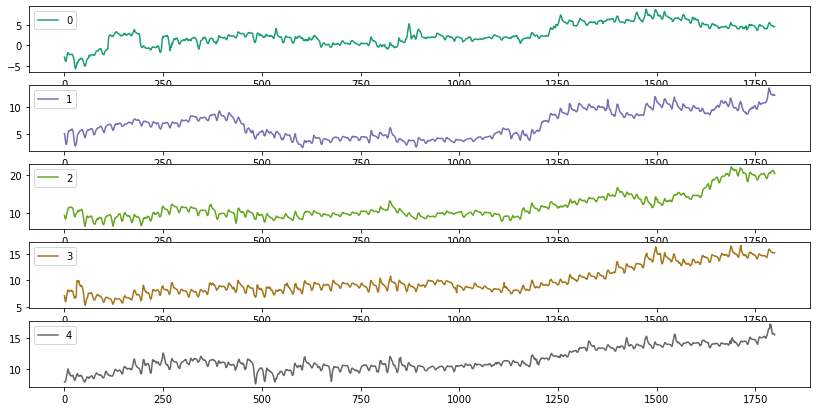

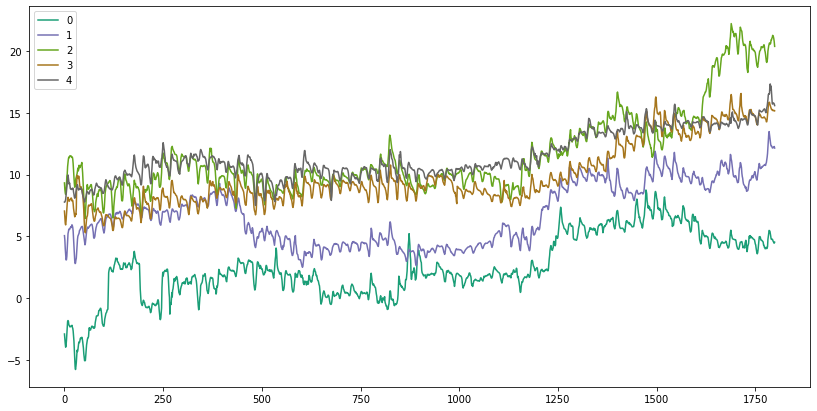

In [126]:
jts.plot_ts(train_df)

In [127]:
jts.mts_adf(train_df)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -2.5285
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.1087. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -0.9489
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.7715. Weak evidence to reject the Null Hypothesis.
 => Series is Non-Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non

### Differencing

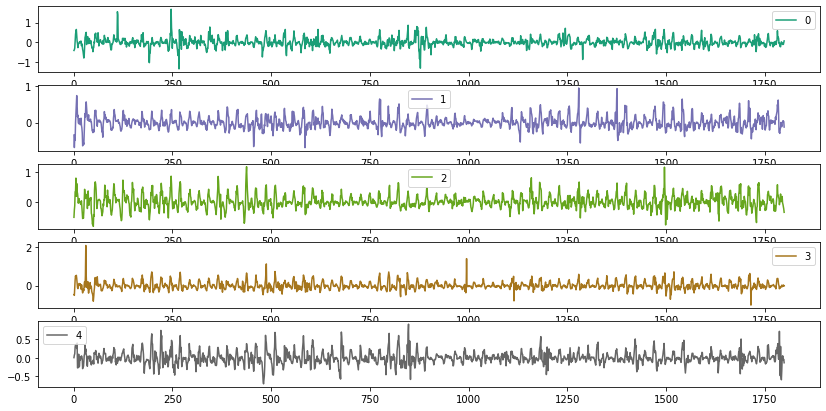

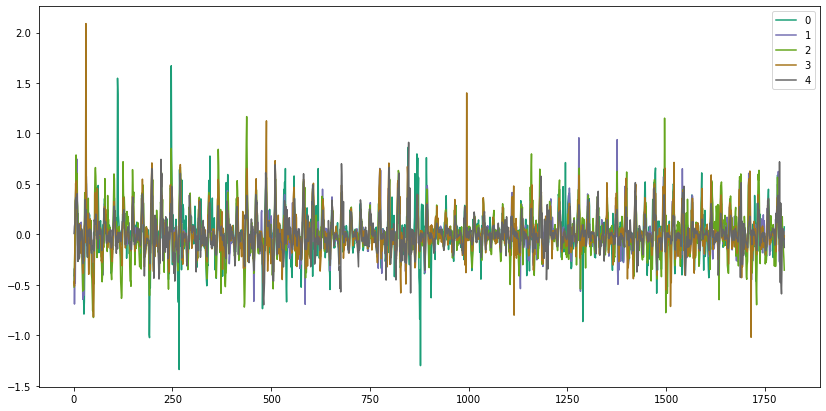

In [128]:
train_diff = train_df.diff().dropna()
jts.plot_ts(train_diff)

In [129]:
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.9861
 No. Lags Chosen       = 23
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -6.2626
 No. Lags Chosen       = 23
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test S

### Order Selection and Modeling

In [130]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -20.361912     -20.270237     -20.328069      3036.336743   0.000000     
2        -20.607010     -20.438861     -20.544934      460.805836    0.000000     
3        -20.720833     -20.476142     -20.630498      226.523184    0.000000     
4        -20.757207     -20.435903     -20.638585      88.795288     0.000000     
5        -20.772152     -20.374166     -20.625215      50.689584     0.001751     
6        -20.770920     -20.296182     -20.595641      22.039627     0.633455     
7        -20.773988     -20.222428     -20.570341      29.477227     0.244461     
8        -20.763023     -20.134571     -20.530979      4.797096      0.999996     


    AIC  = 7
    BIC  = 3
    HQIC = 4
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [131]:
model = VAR(train_diff)
fit = model.fit(5)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:14
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -20.3742
Nobs:                     1794.00    HQIC:                  -20.6252
Log likelihood:           6034.74    FPE:                9.52300e-10
AIC:                     -20.7722    Det(Omega_mle):     8.86194e-10
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.001636         0.003817            0.429           0.668
L1.0          0.434916         0.024455           17.784           0.000
L1.1          0.140762         0.038606            3.646           0.000
L1.2          0.158364 

In [132]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,-0.024316,-0.099793,-0.210544,-0.105341,-0.108148
1,-0.033982,-0.071968,-0.146656,-0.106445,-0.068947
2,-0.034700,-0.046519,-0.069614,-0.057628,-0.029348
3,0.000376,-0.001279,0.009821,0.000399,0.023204
4,0.021675,0.042455,0.086677,0.063562,0.059523
...,...,...,...,...,...
195,0.004073,0.004634,0.005756,0.004350,0.003665
196,0.004073,0.004634,0.005756,0.004350,0.003665
197,0.004073,0.004634,0.005756,0.004350,0.003665
198,0.004073,0.004634,0.005756,0.004350,0.003665


In [133]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[1] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,4.507386,12.044147,20.149288,15.039135,15.467355
1,4.473404,11.972179,20.002632,14.932690,15.398408
2,4.438703,11.925660,19.933018,14.875062,15.369060
3,4.439079,11.924382,19.942839,14.875461,15.392264
4,4.460754,11.966837,20.029515,14.939023,15.451787
...,...,...,...,...,...
195,5.350322,12.995507,21.372205,15.954081,16.290739
196,5.354395,13.000140,21.377962,15.958431,16.294405
197,5.358468,13.004774,21.383718,15.962781,16.298070
198,5.362542,13.009407,21.389475,15.967131,16.301735


# Building the Third Model

In [134]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[2])
train_df

,0,1,2,3,4
0,1.680089,-0.952628,-3.221615,-4.364768,-2.234346
1,1.749371,-0.744782,-3.031089,-4.382089,-2.442192
2,1.922576,-0.433013,-3.135012,-4.451371,-2.788602
3,2.026499,-0.155885,-3.238935,-4.434050,-3.325538
4,2.078461,0.069282,-3.377499,-4.416730,-3.412140
...,...,...,...,...,...
1795,0.640859,1.333679,-2.979127,-3.238935,-3.360179
1796,0.571577,1.316359,-2.909845,-3.221615,-3.377499
1797,0.484974,1.281718,-2.823243,-3.221615,-3.342858
1798,0.450333,1.229756,-2.667358,-3.221615,-3.308217


In [135]:
test_df = pd.DataFrame(test_tensor_model_sets[2])
test_df

,0,1,2,3,4
0,28.58,28.19,27.52,28.03,28.60
1,28.60,28.21,27.54,28.05,28.62
2,28.62,28.24,27.58,28.08,28.67
3,28.64,28.26,27.63,28.12,28.77
4,28.67,28.30,27.68,28.16,28.87
...,...,...,...,...,...
195,29.07,28.49,28.01,27.84,28.87
196,29.16,28.55,28.11,28.04,28.88
197,29.23,28.56,28.20,28.15,28.95
198,29.25,28.58,28.28,28.43,29.26


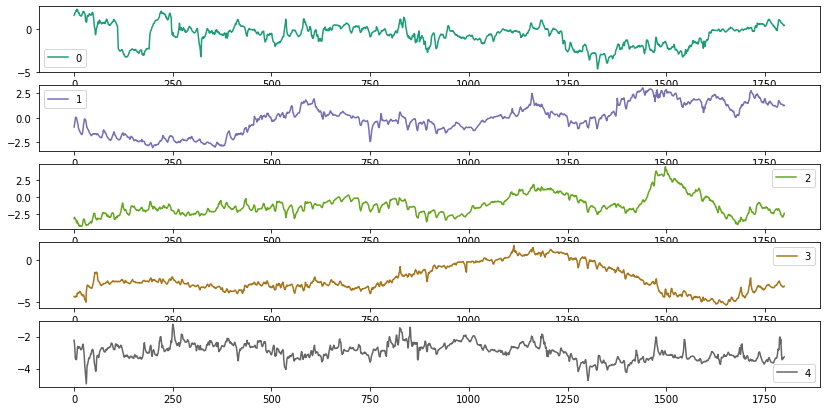

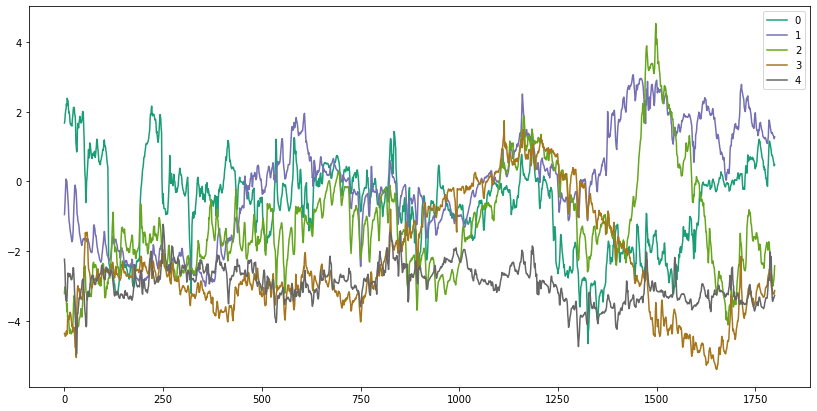

In [136]:
jts.plot_ts(train_df)

### Differencing

In [137]:
train_diff = train_df.diff().dropna()
train_diff

,0,1,2,3,4
1,0.069282,0.207846,0.190526,-1.732051e-02,-0.207846
2,0.173205,0.311769,-0.103923,-6.928203e-02,-0.346410
3,0.103923,0.277128,-0.103923,1.732051e-02,-0.536936
4,0.051962,0.225167,-0.138564,1.732051e-02,-0.086603
5,0.155885,-0.051962,-0.069282,1.212436e-01,-0.017321
...,...,...,...,...,...
1795,-0.069282,-0.017321,0.034641,-5.196152e-02,0.086603
1796,-0.069282,-0.017321,0.069282,1.732051e-02,-0.017321
1797,-0.086603,-0.034641,0.086603,-1.554312e-14,0.034641
1798,-0.034641,-0.051962,0.155885,3.108624e-15,0.034641


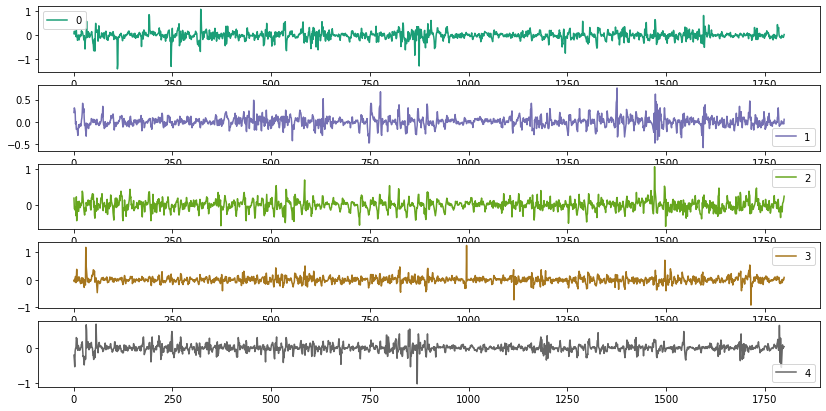

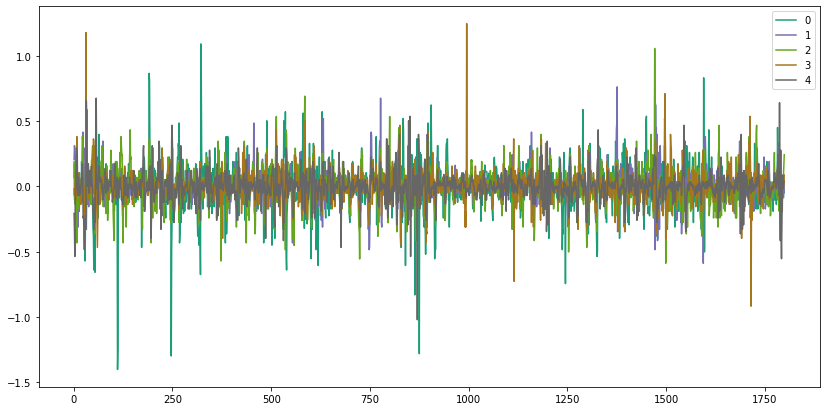

In [138]:
jts.plot_ts(train_diff)

In [139]:
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -8.2365
 No. Lags Chosen       = 23
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.5514
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test S

### Order Selection and Modeling

In [140]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -21.564883     -21.473208     -21.531041      1727.366029   0.000000     
2        -21.596012     -21.427863     -21.533937      80.048508     0.000000     
3        -21.656708     -21.412017     -21.566373      132.248695    0.000000     
4        -21.664869     -21.343566     -21.546247      38.873243     0.037931     
5        -21.690545     -21.292560     -21.543609      69.624692     0.000004     
6        -21.689659     -21.214921     -21.514380      22.646720     0.598184     
7        -21.688802     -21.137242     -21.485154      22.589967     0.601493     
8        -21.697749     -21.069297     -21.465704      39.633894     0.031790     


    AIC  = 8
    BIC  = 1
    HQIC = 3
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [141]:
model = VAR(train_diff)
fit = model.fit(5)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:18
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -21.2926
Nobs:                     1794.00    HQIC:                  -21.5436
Log likelihood:           6858.54    FPE:                3.80120e-10
AIC:                     -21.6905    Det(Omega_mle):     3.53733e-10
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const        -0.000597         0.003700           -0.161           0.872
L1.0          0.400459         0.023748           16.863           0.000
L1.1         -0.023402         0.038295           -0.611           0.541
L1.2          0.087452 

In [142]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.030105,0.057664,0.142652,0.067570,0.030336
1,0.013337,0.051864,0.080639,0.045236,0.031665
2,0.003794,0.031524,0.030786,0.016759,0.002826
3,-0.007864,0.016192,0.000211,-0.012254,-0.013040
4,-0.034762,-0.010803,-0.028827,-0.027633,-0.019661
...,...,...,...,...,...
195,-0.000973,0.000897,0.000747,0.000664,-0.000013
196,-0.000973,0.000897,0.000747,0.000664,-0.000013
197,-0.000973,0.000897,0.000747,0.000664,-0.000013
198,-0.000973,0.000897,0.000747,0.000664,-0.000013


In [143]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[2] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.515079,1.339382,-2.282219,-3.067442,-3.243240
1,0.528416,1.391246,-2.201580,-3.022206,-3.211575
2,0.532210,1.422770,-2.170794,-3.005447,-3.208749
3,0.524347,1.438962,-2.170583,-3.017701,-3.221789
4,0.489584,1.428159,-2.199410,-3.045333,-3.241450
...,...,...,...,...,...
195,0.239554,1.547471,-2.122442,-2.955324,-3.276134
196,0.238581,1.548368,-2.121695,-2.954660,-3.276147
197,0.237607,1.549265,-2.120948,-2.953996,-3.276160
198,0.236634,1.550162,-2.120201,-2.953331,-3.276173


# Building the Forth Model

In [144]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[3])
train_df

,0,1,2,3,4
0,-0.523259,-0.056569,0.268701,2.404163,-0.834386
1,-0.565685,-0.155563,0.410122,2.573869,-0.650538
2,-0.749533,-0.169706,0.565685,2.672864,-0.494975
3,-0.749533,-0.127279,0.664680,2.771859,-0.240416
4,-0.678823,-0.141421,0.791960,2.955706,-0.466690
...,...,...,...,...,...
1795,-0.452548,-1.329361,-0.226274,1.810193,1.838478
1796,-0.452548,-1.371787,-0.311127,1.810193,1.895046
1797,-0.466690,-1.400071,-0.381838,1.781909,1.838478
1798,-0.494975,-1.357645,-0.509117,1.725341,1.810193


In [145]:
test_df = pd.DataFrame(test_tensor_model_sets[3])
test_df

,0,1,2,3,4
0,28.38,26.29,25.50,27.61,27.61
1,28.39,26.32,25.54,27.62,27.62
2,28.40,26.35,25.58,27.65,27.64
3,28.41,26.38,25.62,27.67,27.66
4,28.41,26.41,25.65,27.68,27.68
...,...,...,...,...,...
195,28.27,25.75,25.81,26.91,27.55
196,28.29,25.75,25.87,26.95,27.60
197,28.31,25.80,25.91,26.98,27.60
198,28.31,25.81,25.92,26.98,27.60


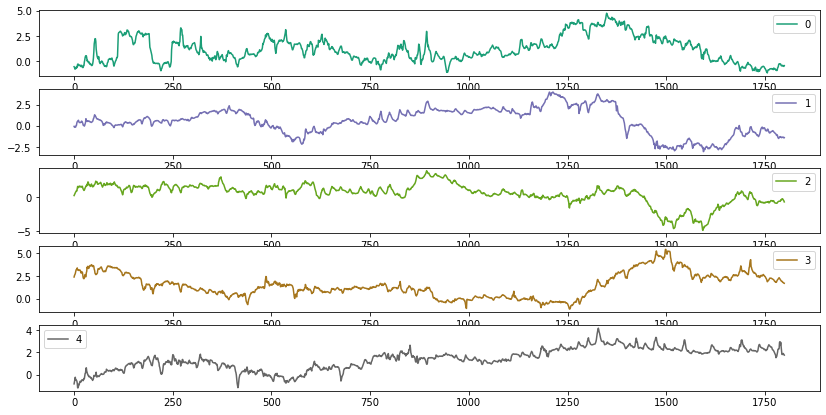

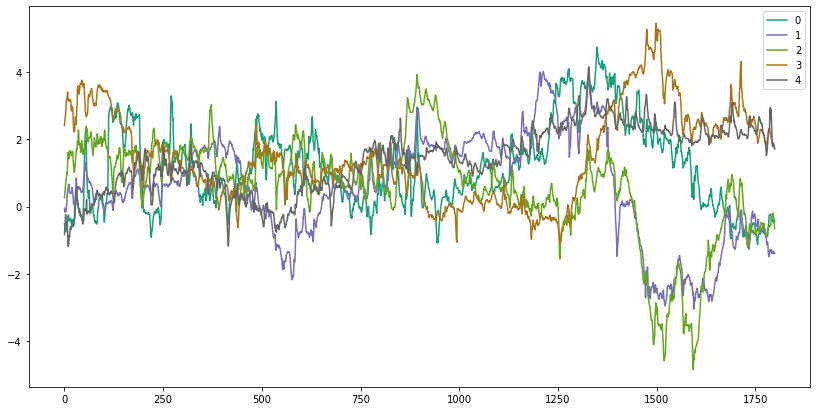

In [146]:
jts.plot_ts(train_df)

### Differencing

In [147]:
train_diff = train_df.diff().dropna()
train_diff

,0,1,2,3,4
1,-4.242641e-02,-9.899495e-02,0.141421,1.697056e-01,1.838478e-01
2,-1.838478e-01,-1.414214e-02,0.155563,9.899495e-02,1.555635e-01
3,-2.220446e-16,4.242641e-02,0.098995,9.899495e-02,2.545584e-01
4,7.071068e-02,-1.414214e-02,0.127279,1.838478e-01,-2.262742e-01
5,-1.414214e-02,1.838478e-01,0.070711,2.262742e-01,-4.718448e-15
...,...,...,...,...,...
1795,-7.071068e-02,-6.661338e-16,-0.028284,-7.071068e-02,4.242641e-02
1796,-5.051515e-15,-4.242641e-02,-0.084853,-2.220446e-16,5.656854e-02
1797,-1.414214e-02,-2.828427e-02,-0.070711,-2.828427e-02,-5.656854e-02
1798,-2.828427e-02,4.242641e-02,-0.127279,-5.656854e-02,-2.828427e-02


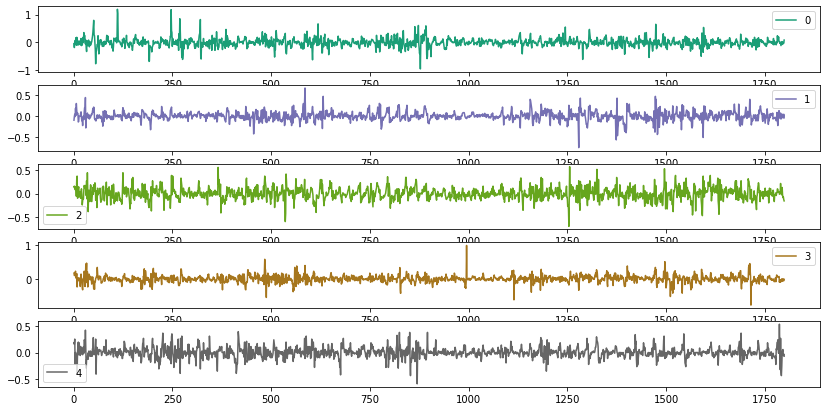

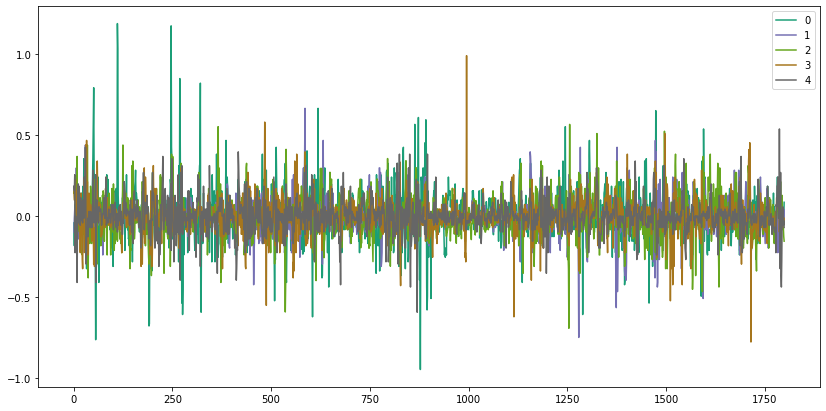

In [148]:
jts.plot_ts(train_diff)

In [149]:
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -14.3093
 No. Lags Chosen       = 13
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -13.7251
 No. Lags Chosen       = 12
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test

### Order Selection and Modeling

In [150]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -22.235051     -22.143376     -22.201209      1355.493205   0.000000     
2        -22.227609     -22.059460     -22.165533      11.411104     0.990704     
3        -22.226933     -21.982242     -22.136598      23.345195     0.557414     
4        -22.228602     -21.907298     -22.109980      27.383781     0.336989     
5        -22.237368     -21.839382     -22.090431      39.786786     0.030669     
6        -22.242639     -21.767902     -22.067361      33.482547     0.119439     
7        -22.236456     -21.684896     -22.032808      13.244561     0.973361     
8        -22.228512     -21.600059     -21.996467      10.082551     0.996425     


    AIC  = 6
    BIC  = 1
    HQIC = 1
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [151]:
model = VAR(train_diff)
fit = model.fit(5)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:22
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -21.8394
Nobs:                     1794.00    HQIC:                  -22.0904
Log likelihood:           7349.04    FPE:                2.20008e-10
AIC:                     -22.2374    Det(Omega_mle):     2.04736e-10
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.000159         0.003310            0.048           0.962
L1.0          0.413804         0.023735           17.434           0.000
L1.1          0.052529         0.035294            1.488           0.137
L1.2          0.009143 

In [152]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.048243,-0.029650,-0.059339,-0.021245,-0.035750
1,0.019452,-0.012687,-0.020598,-0.020099,-0.011635
2,0.022003,-0.016184,-0.008343,-0.010581,-0.000847
3,0.018453,-0.009086,0.007496,-0.005888,0.006030
4,0.011649,0.000954,0.013643,-0.004620,0.009913
...,...,...,...,...,...
195,0.000259,-0.000873,-0.000902,-0.000888,0.001238
196,0.000259,-0.000873,-0.000902,-0.000888,0.001238
197,0.000259,-0.000873,-0.000902,-0.000888,0.001238
198,0.000259,-0.000873,-0.000902,-0.000888,0.001238


In [153]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[3] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,-0.361879,-1.429721,-0.724020,1.689953,1.703733
1,-0.342427,-1.442408,-0.744618,1.669854,1.692098
2,-0.320424,-1.458592,-0.752961,1.659273,1.691250
3,-0.301972,-1.467678,-0.745464,1.653385,1.697281
4,-0.290323,-1.466724,-0.731822,1.648765,1.707194
...,...,...,...,...,...
195,-0.238973,-1.614414,-0.876704,1.486798,1.956456
196,-0.238714,-1.615287,-0.877606,1.485910,1.957694
197,-0.238454,-1.616160,-0.878508,1.485021,1.958932
198,-0.238195,-1.617033,-0.879410,1.484133,1.960170


# Building the Fifth Model

In [154]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[4])
train_df

,0,1,2,3,4
0,-0.03,-0.47,0.94,-0.26,-0.83
1,0.29,-0.47,0.67,-0.19,-0.73
2,0.63,-0.67,0.53,-0.09,-0.61
3,0.95,-0.79,0.59,0.16,-0.38
4,1.10,-0.88,0.37,0.31,-0.51
...,...,...,...,...,...
1795,0.73,0.27,0.38,-0.21,-0.98
1796,0.75,0.28,0.40,-0.16,-1.01
1797,0.78,0.22,0.45,-0.12,-1.01
1798,0.82,0.25,0.50,-0.10,-0.99


In [155]:
test_df = pd.DataFrame(test_tensor_model_sets[4])
test_df

,0,1,2,3,4
0,27.63,25.96,23.62,25.62,26.28
1,27.64,25.98,23.70,25.65,26.29
2,27.66,25.97,23.74,25.67,26.32
3,27.67,25.96,23.84,25.68,26.35
4,27.70,25.98,23.89,25.68,26.37
...,...,...,...,...,...
195,27.31,25.48,23.56,25.25,26.60
196,27.29,25.60,23.56,25.31,26.61
197,27.29,25.68,23.54,25.32,26.62
198,27.28,25.74,23.52,25.32,26.61


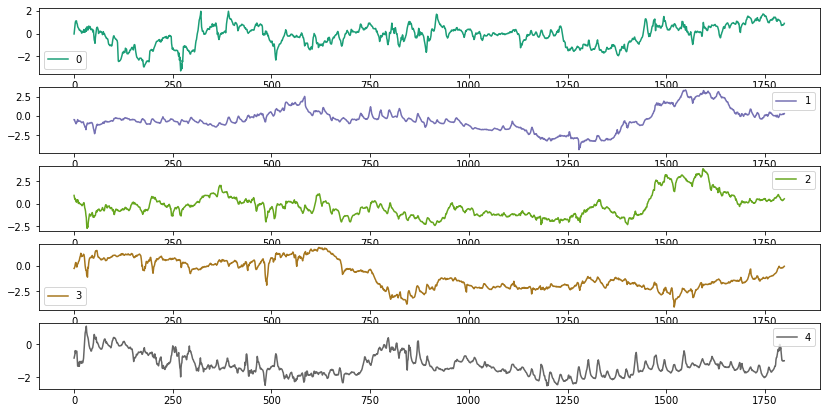

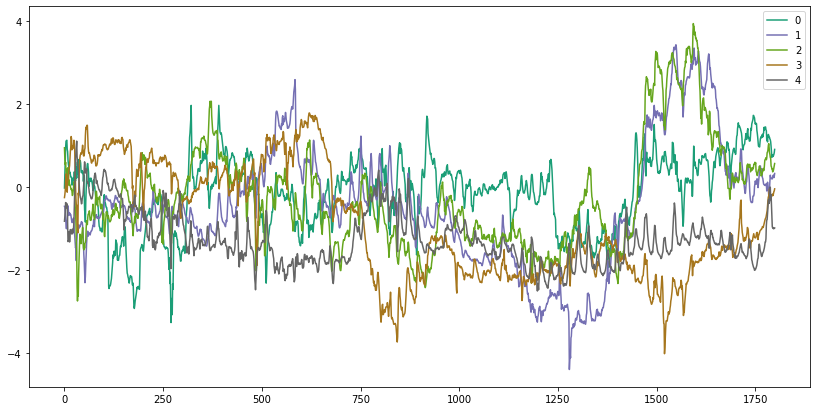

In [156]:
jts.plot_ts(train_df)

### Differencing

In [157]:
train_diff = train_df.diff().dropna()
train_diff

,0,1,2,3,4
1,0.32,-1.887379e-15,-0.27,0.07,1.000000e-01
2,0.34,-2.000000e-01,-0.14,0.10,1.200000e-01
3,0.32,-1.200000e-01,0.06,0.25,2.300000e-01
4,0.15,-9.000000e-02,-0.22,0.15,-1.300000e-01
5,0.01,-1.300000e-01,-0.10,-0.01,1.100000e-01
...,...,...,...,...,...
1795,-0.04,3.000000e-02,0.02,-0.03,1.000000e-02
1796,0.02,1.000000e-02,0.02,0.05,-3.000000e-02
1797,0.03,-6.000000e-02,0.05,0.04,1.043610e-14
1798,0.04,3.000000e-02,0.05,0.02,2.000000e-02


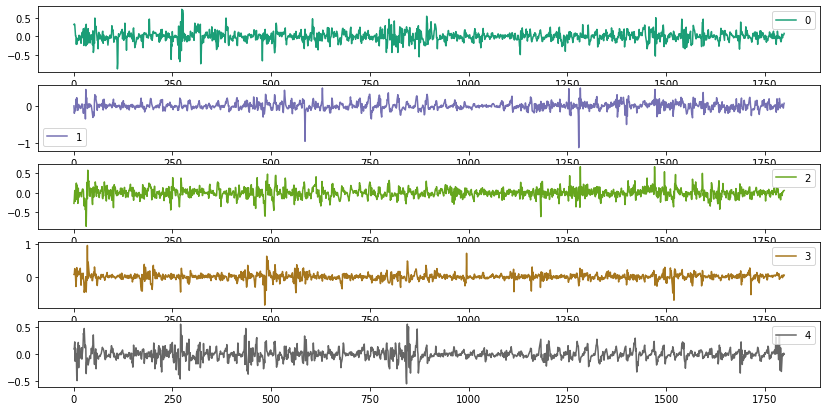

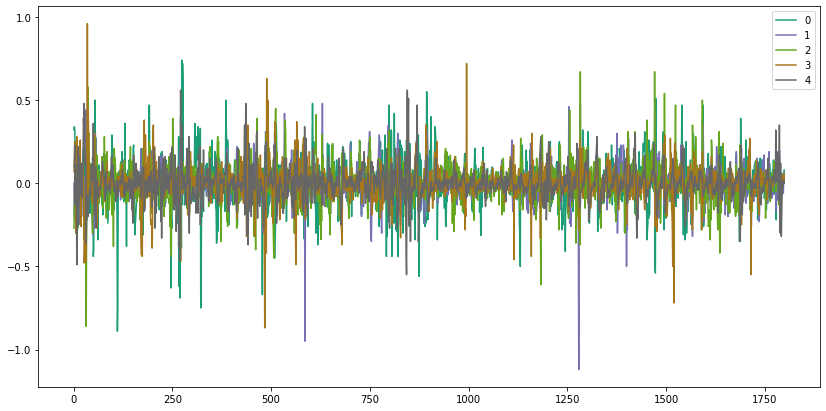

In [158]:
jts.plot_ts(train_diff)

In [159]:
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -10.6731
 No. Lags Chosen       = 24
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -8.3386
 No. Lags Chosen       = 22
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test 

### Order Selection and Modeling

In [160]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -22.541932     -22.450256     -22.508089      1557.589727   0.000000     
2        -22.555773     -22.387625     -22.493698      49.286199     0.002607     
3        -22.577682     -22.332991     -22.487347      63.420887     0.000035     
4        -22.618251     -22.296948     -22.499629      96.218381     0.000000     
5        -22.644100     -22.246114     -22.497163      69.929857     0.000004     
6        -22.641325     -22.166587     -22.466047      19.324320     0.781310     
7        -22.652295     -22.100735     -22.448647      43.339768     0.012842     
8        -22.660494     -22.032042     -22.428449      38.325109     0.042989     


    AIC  = 8
    BIC  = 1
    HQIC = 1
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [161]:
model = VAR(train_diff)
fit = model.fit(8)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:26
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -22.0320
Nobs:                     1791.00    HQIC:                  -22.4284
Log likelihood:           7790.88    FPE:                1.44109e-10
AIC:                     -22.6605    Det(Omega_mle):     1.28689e-10
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const         0.000095         0.003070            0.031           0.975
L1.0          0.329597         0.023892           13.795           0.000
L1.1          0.019119         0.033975            0.563           0.574
L1.2          0.075813 

In [162]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.046143,0.034112,0.032723,0.026206,0.027100
1,0.045672,0.022675,0.040857,-0.005755,0.027631
2,0.026884,0.014123,0.009972,-0.003992,0.010984
3,0.002698,0.001842,-0.006338,-0.006514,-0.000607
4,-0.007872,-0.007152,-0.005543,-0.014550,0.002800
...,...,...,...,...,...
195,0.000119,0.000490,0.000091,-0.000196,0.000033
196,0.000119,0.000490,0.000091,-0.000196,0.000033
197,0.000119,0.000490,0.000091,-0.000196,0.000033
198,0.000119,0.000490,0.000091,-0.000196,0.000033


In [163]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[4] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.946143,0.354112,0.592723,-0.023794,-0.962900
1,0.991815,0.376787,0.633581,-0.029549,-0.935269
2,1.018699,0.390910,0.643552,-0.033540,-0.924286
3,1.021397,0.392752,0.637214,-0.040054,-0.924893
4,1.013525,0.385600,0.631671,-0.054605,-0.922093
...,...,...,...,...,...
195,0.985063,0.459518,0.624968,-0.107889,-0.938631
196,0.985182,0.460008,0.625059,-0.108085,-0.938598
197,0.985300,0.460498,0.625150,-0.108282,-0.938565
198,0.985419,0.460989,0.625241,-0.108478,-0.938532


# Building the Final Model

In [164]:
train_df = pd.DataFrame(train_dct_tensor_model_sets[5])
train_df

,0,1,2,3,4
0,-0.665722,-2.050311,1.207610,0.150069,-0.302108
1,-0.990719,-1.999290,1.264822,0.059296,-0.604641
2,-1.305364,-1.700275,1.297911,0.083048,-0.977884
3,-1.507886,-1.458843,0.939825,0.191009,-1.504289
4,-1.548926,-0.997329,0.508998,-0.033879,-1.532202
...,...,...,...,...,...
1795,-1.165176,1.732926,0.393638,-1.370765,0.168525
1796,-1.122750,1.657039,0.387075,-1.404225,0.198196
1797,-1.043074,1.628755,0.379124,-1.432510,0.201986
1798,-1.028931,1.619789,0.350468,-1.495642,0.191633


In [165]:
test_df = pd.DataFrame(test_tensor_model_sets[5])
test_df

,0,1,2,3,4
0,27.98,25.69,22.75,24.38,24.48
1,27.99,25.68,22.90,24.42,24.51
2,28.00,25.69,22.92,24.46,24.58
3,28.00,25.68,22.82,24.49,24.61
4,27.99,25.69,22.78,24.49,24.63
...,...,...,...,...,...
195,27.75,23.05,22.26,23.84,24.53
196,27.74,23.22,22.29,23.84,24.55
197,27.73,23.33,22.22,23.81,24.53
198,27.71,23.39,22.16,23.75,24.50


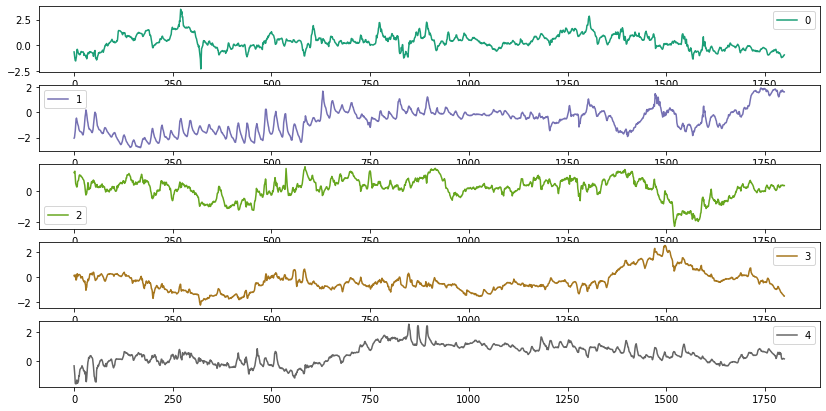

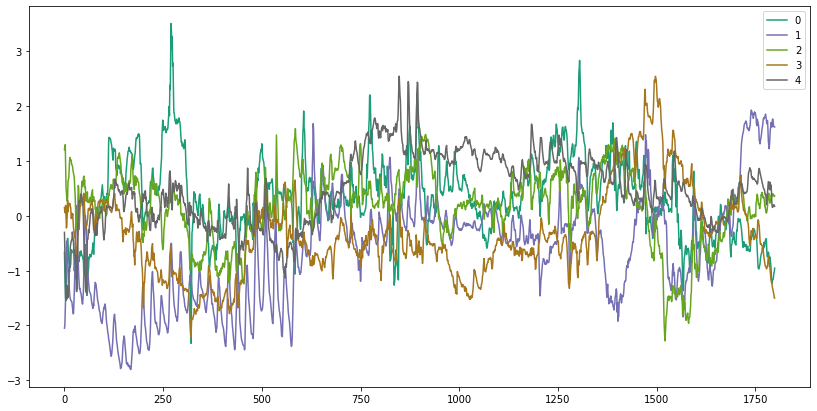

In [166]:
jts.plot_ts(train_df)

### Differencing

In [167]:
train_diff = train_df.diff().dropna()
train_diff

,0,1,2,3,4
1,-0.324997,0.051021,0.057212,-0.090772,-0.302533
2,-0.314644,0.299016,0.033089,0.023752,-0.373244
3,-0.202523,0.241432,-0.358086,0.107961,-0.526405
4,-0.041039,0.461514,-0.430827,-0.224887,-0.027913
5,0.252899,0.413268,-0.103800,-0.187265,0.059714
...,...,...,...,...,...
1795,0.007579,-0.033461,-0.010353,-0.043813,0.015529
1796,0.042426,-0.075887,-0.006563,-0.033461,0.029671
1797,0.079676,-0.028284,-0.007950,-0.028284,0.003789
1798,0.014142,-0.008966,-0.028656,-0.063132,-0.010353


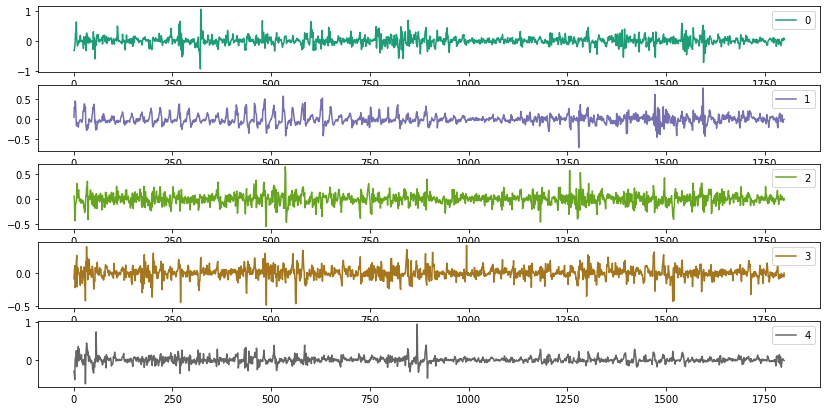

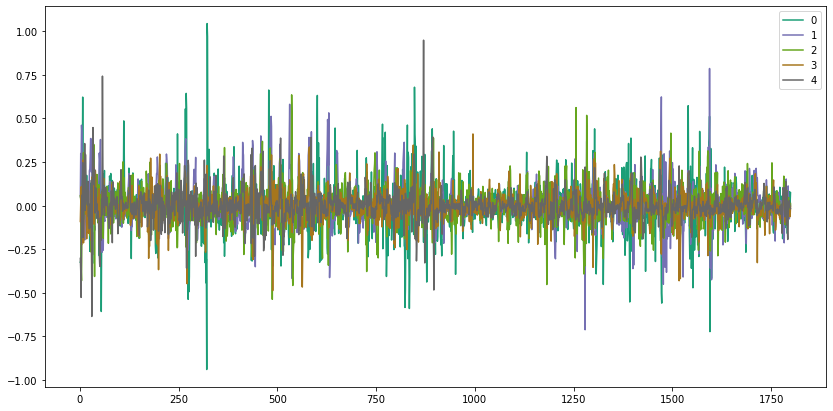

In [168]:
jts.plot_ts(train_diff)

In [169]:
jts.mts_adf(train_diff)

    Augmented Dickey-Fuller Test on "0" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -10.8735
 No. Lags Chosen       = 20
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "1" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test Statistic        = -7.8887
 No. Lags Chosen       = 25
 Critical value 1%     = -3.434
 Critical value 5%     = -2.863
 Critical value 10%    = -2.568
 => P-Value = 0.0. Rejecting Null Hypothesis.
 => Series is Stationary.


    Augmented Dickey-Fuller Test on "2" 
    -----------------------------------------------
 Null Hypothesis: Data has unit root. Non-Stationary.
 Significance Level    = 0.05
 Test 

### Order Selection and Modeling

In [170]:
jts.var_order(train_diff)

    Sequential Ratio Test 
 ---------------------------------------------------------------------------
p            AIC            BIC            HQIC            M          p-value
1        -23.358665     -23.266989     -23.324822      1736.548584   0.000000     
2        -23.365657     -23.197508     -23.303582      37.097455     0.056519     
3        -23.381912     -23.137221     -23.291577      53.387789     0.000797     
4        -23.407914     -23.086610     -23.289292      70.442169     0.000003     
5        -23.430935     -23.032949     -23.283999      64.940802     0.000021     
6        -23.428842     -22.954104     -23.253563      20.523031     0.718880     
7        -23.441310     -22.889750     -23.237662      45.969787     0.006470     
8        -23.442110     -22.813657     -23.210065      25.378838     0.441311     


    AIC  = 8
    BIC  = 1
    HQIC = 1
C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: Va

In [171]:
model = VAR(train_diff)
fit = model.fit(7)
fit.summary()

C:\Users\jacks\AppData\Local\Programs\Python\Python39\lib\site-packages\statsmodels\tsa\base\tsa_model.py:578: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  warnings.warn('An unsupported index was provided and will be'


  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sun, 17, Jan, 2021
Time:                     17:25:29
--------------------------------------------------------------------
No. of Equations:         5.00000    BIC:                   -22.8898
Nobs:                     1792.00    HQIC:                  -23.2377
Log likelihood:           8469.72    FPE:                6.60055e-11
AIC:                     -23.4413    Det(Omega_mle):     5.97571e-11
--------------------------------------------------------------------
Results for equation 0
           coefficient       std. error           t-stat            prob
------------------------------------------------------------------------
const        -0.000431         0.003137           -0.138           0.891
L1.0          0.310145         0.023759           13.054           0.000
L1.1         -0.061499         0.033768           -1.821           0.069
L1.2          0.032895 

In [172]:
test_df.columns = test_df.columns[:].astype(str)
results_diff_long = jts.forecast(fit, train_diff, test_df, N_test, calc_conf = False)
results_diff_long

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,0.015019,-0.002743,-0.004276,0.004819,-0.006264
1,0.011730,0.006939,-0.011586,0.006245,0.000345
2,0.001812,0.012203,-0.002463,0.008824,-0.003396
3,-0.004780,0.014452,-0.000489,0.009609,0.002970
4,-0.006618,0.009444,0.002377,0.008239,0.009148
...,...,...,...,...,...
195,-0.000316,0.001563,-0.000054,-0.000910,0.000661
196,-0.000316,0.001563,-0.000054,-0.000910,0.000661
197,-0.000316,0.001563,-0.000054,-0.000910,0.000661
198,-0.000316,0.001563,-0.000054,-0.000910,0.000661


In [173]:
result_df = jts.invert_diff_transformation(results_diff_long, train_df)
result_tensor_model_sets[5] = result_df
result_df

,0_forecast,1_forecast,2_forecast,3_forecast,4_forecast
0,-0.940427,1.619449,0.358576,-1.495999,0.168453
1,-0.928698,1.626388,0.346989,-1.489754,0.168798
2,-0.926886,1.638590,0.344526,-1.480930,0.165402
3,-0.931666,1.653042,0.344038,-1.471321,0.168372
4,-0.938285,1.662486,0.346415,-1.463082,0.177519
...,...,...,...,...,...
195,-1.016477,1.963385,0.343452,-1.635572,0.312549
196,-1.016793,1.964948,0.343398,-1.636482,0.313211
197,-1.017110,1.966511,0.343344,-1.637392,0.313872
198,-1.017426,1.968074,0.343290,-1.638302,0.314534


# Inverting the DCT

In [174]:
result_tensor_model_sets

array([[[ 3.41731361e+02,  3.28761112e+02,  3.13415589e+02,
          3.28588419e+02,  3.32561522e+02],
        [ 3.41870871e+02,  3.28883406e+02,  3.13685615e+02,
          3.28776833e+02,  3.32677739e+02],
        [ 3.42057732e+02,  3.29061371e+02,  3.13952677e+02,
          3.28990129e+02,  3.32818902e+02],
        ...,
        [ 3.41806325e+02,  3.28360449e+02,  3.12880866e+02,
          3.28290133e+02,  3.31444755e+02],
        [ 3.41805362e+02,  3.28356606e+02,  3.12875622e+02,
          3.28286465e+02,  3.31437891e+02],
        [ 3.41804398e+02,  3.28352764e+02,  3.12870378e+02,
          3.28282798e+02,  3.31431026e+02]],

       [[ 4.50738558e+00,  1.20441473e+01,  2.01492876e+01,
          1.50391349e+01,  1.54673545e+01],
        [ 4.47340367e+00,  1.19721795e+01,  2.00026318e+01,
          1.49326899e+01,  1.53984079e+01],
        [ 4.43870335e+00,  1.19256604e+01,  1.99330176e+01,
          1.48750621e+01,  1.53690596e+01],
        ...,
        [ 5.35846836e+00,  1.3004773

In [175]:
result_dct_tensor = np.zeros((N_test, matrix_shape[0], matrix_shape[1]))
result_dct_tensor

array([[[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.]],

       [[0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 

In [176]:
for i in range(N_test):
    for j in range(matrix_shape[1]):
        result_dct_tensor[i][:,j] = result_tensor_model_sets[j][i]
result_dct_tensor

array([[[ 3.41731361e+02,  4.50738558e+00,  5.15079275e-01,
         -3.61878768e-01,  9.46142928e-01, -9.40427308e-01],
        [ 3.28761112e+02,  1.20441473e+01,  1.33938157e+00,
         -1.42972106e+00,  3.54112423e-01,  1.61944870e+00],
        [ 3.13415589e+02,  2.01492876e+01, -2.28221937e+00,
         -7.24019657e-01,  5.92723428e-01,  3.58575554e-01],
        [ 3.28588419e+02,  1.50391349e+01, -3.06744199e+00,
          1.68995306e+00, -2.37935793e-02, -1.49599852e+00],
        [ 3.32561522e+02,  1.54673545e+01, -3.24324013e+00,
          1.70373295e+00, -9.62900420e-01,  1.68452951e-01]],

       [[ 3.41870871e+02,  4.47340367e+00,  5.28416000e-01,
         -3.42427237e-01,  9.91814531e-01, -9.28697683e-01],
        [ 3.28883406e+02,  1.19721795e+01,  1.39124602e+00,
         -1.44240778e+00,  3.76787258e-01,  1.62638768e+00],
        [ 3.13685615e+02,  2.00026318e+01, -2.20157993e+00,
         -7.44617977e-01,  6.33580755e-01,  3.46989185e-01],
        [ 3.28776833e+02,  1.4

In [177]:
result_tensor = jts.apply_inverse_dct_to_tensor(result_dct_tensor)
result_tensor

array([[[29.27322277, 29.0046017 , 28.56779693, 28.39642989,
         27.63524424, 27.9883852 ],
        [29.45991369, 28.73479733, 28.18169352, 26.28419769,
         25.94068382, 25.77926982],
        [29.0118768 , 28.43686287, 27.50899206, 25.48454673,
         23.60149423, 22.66402203],
        [29.49338383, 29.1358551 , 28.03186815, 27.61439694,
         25.63681254, 24.38189279],
        [29.86320328, 29.47614957, 28.59487951, 27.60780022,
         26.27173759, 24.46699089]],

       [[29.28790719, 29.00093598, 28.57943375, 28.41180655,
         27.64693761, 28.00841423],
        [29.46669873, 28.73340531, 28.18579612, 26.28928471,
         25.95490002, 25.81161836],
        [29.02288587, 28.43906487, 27.51749569, 25.50457826,
         23.63067732, 22.72810531],
        [29.49589911, 29.14160364, 28.03934283, 27.62430689,
         25.6643849 , 24.42287937],
        [29.86730514, 29.47443427, 28.60074899, 27.6167644 ,
         26.283612  , 24.49600457]],

       [[29.30335187, 29.0

In [178]:
error = jts.calc_mape_per_matrix(test_tensor, result_tensor)
perc_error = error.rename(columns={"MAPE": "VAR with DCT"})
perc_error

,VAR with DCT
0,0.000953866
1,0.00170155
2,0.00193918
3,0.00235374
4,0.00366658
...,...
195,0.0203206
196,0.0196498
197,0.0197368
198,0.0204425


<AxesSubplot:>

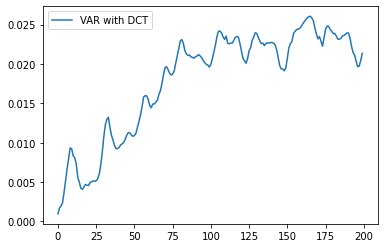

In [179]:
perc_error.plot()

<AxesSubplot:>

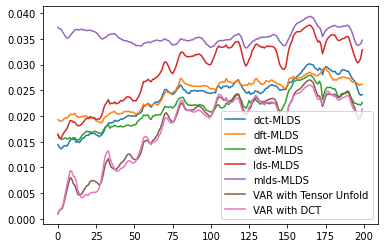

In [180]:
sst_err = sio.loadmat('data/sst_err.mat')
df = pd.DataFrame(np.transpose(sst_err['err_dct']), index=error.index, columns=["dct-MLDS"])
df1 = pd.DataFrame(np.transpose(sst_err['err_dft']), index=error.index, columns=["dft-MLDS"])
df2 = pd.DataFrame(np.transpose(sst_err['err_dwt']), index=error.index, columns=["dwt-MLDS"])
df3 = pd.DataFrame(np.transpose(sst_err['err_lds']), index=error.index, columns=["lds-MLDS"])
df4 = pd.DataFrame(np.transpose(sst_err['err_mlds']), index=error.index, columns=["mlds-MLDS"])
tensor_unfold_err = pd.read_csv("data/VAR_with_unfold.csv")
del tensor_unfold_err['Unnamed: 0']
df = pd.concat([df, df1, df2, df3, df4, tensor_unfold_err, perc_error], axis=1)
df.plot()

<AxesSubplot:>

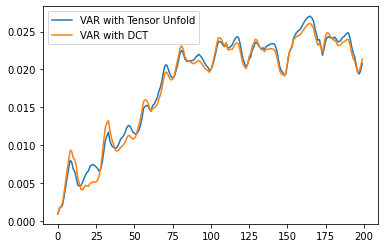

In [181]:
df = pd.concat([tensor_unfold_err, perc_error], axis=1)
df.plot()

<AxesSubplot:title={'center':'Difference in % error with unfold and DCT'}>

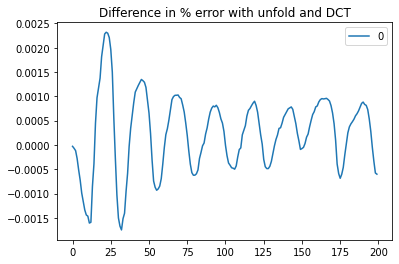

In [182]:
df = pd.DataFrame(tensor_unfold_err['VAR with Tensor Unfold'] - perc_error['VAR with DCT'])
df.plot(title="Difference in % error with unfold and DCT")

<AxesSubplot:>

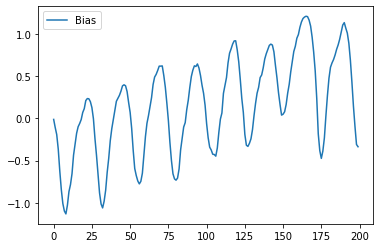

In [183]:
bias = pd.DataFrame(index = range(N_test), columns = ["Bias"])

norms = []
for i in range(N_test):
    norms.append(np.linalg.norm(result_tensor[i]))

avg_result_matrix_norm = np.average(norms)

for i in range(N_test):

    test_matrx_norm = np.linalg.norm(test_tensor[i])
    matrix_bias = avg_result_matrix_norm - test_matrx_norm
    bias.iloc[i] = matrix_bias
bias.plot()

In [184]:
bias.mean()

Bias    0.150793
dtype: float64

In [185]:
statistics.variance(norms)

0.011636495945389276

In [186]:
sqr_error = 0
for i in range(N_test):
    sqr_error += (norms[i] - np.linalg.norm(test_tensor[i]))**2
sqr_error / N_test

0.28853375560660177

In [187]:
error.mean()

MAPE    0.017888
dtype: float64